# Loading packages and data

In [1]:
%%capture
!pip install scanpy igraph leidenalg imagecodecs GDAL squidpy

In [2]:
%%capture
import numpy as np
import pandas as pd

import scanpy as sc
import igraph as ig
import leidenalg as la

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.figure import Figure as _Figure
import matplotlib.patches as mpatches

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import calinski_harabasz_score, silhouette_score, davies_bouldin_score, pairwise_distances
import seaborn as sns

from scipy.spatial.distance import cdist
from scipy.optimize import linear_sum_assignment

#for image loading and handling
import PIL
from PIL import Image, ImageSequence, ImageOps
import imagecodecs
from osgeo import gdal
import xml.etree.ElementTree as ET
from inspect import CO_VARARGS
from skimage import io as tiff
from skimage.measure import label
from skimage.segmentation import relabel_sequential

import functions

In [33]:
# Paths to alternative raw files
feature_tiff_path = "/data/raw_data/lung_cancer/lung_cancer_features.tif"
mask_tiff_path = "/data/raw_data/lung_cancer/lung_cancer_segmentation_mask.tif"

In [34]:
raw_img_data, metadata =  read_tiff_all_bands(feature_tiff_path)

# Extracting metadata from the feature image to get channels
xml_content = metadata['TIFFTAG_IMAGEDESCRIPTION']
root = ET.fromstring(xml_content)
namespace = {'ome': 'http://www.openmicroscopy.org/Schemas/OME/2016-06'}
channels = []
# Traverse the XML tree to extract channel information
for channel in root.findall('.//ome:Channel', namespace):
    channel_id = channel.get('ID').split(':')[1]
    channel_name = channel.get('Name')
    channels.append({
        '': channel_id,
        'channel': channel_name,
    })

# Convert list of dictionaries to pandas DataFrame
channels_df1 = pd.DataFrame(channels)[:48] # here removing 2 non-channels
#print(channels_df1)
mask_data = read_single_band(mask_tiff_path)

mask = preprocess_mask(mask_data)

cropped_img_data = crop_tiff_to_match_mask(raw_img_data, mask_data.shape)
noisy_channels = {0,1,2,3,4,5,6,39,40,41,42,43,44,45,46,47}
# removed channels: 80ArAr, 89Y, 120Sn, 127I, 131Xe, 138Ba, 140Ce, 189Os, 190BCKG, 191Ir_DNA1, 193Ir_DNA2, ICSK1, ICSK2, ICSK3, 202Hg, 208Pb
# Calculate remaining channels by excluding noisy ones
all_channels = set(range(cropped_img_data.shape[2]))
remaining_channels = list(all_channels - noisy_channels)

# Select the non-noisy channels
img = cropped_img_data[remaining_channels, :, :]
channels_df = channels_df1.iloc[remaining_channels]

# Overview of data

In [31]:
print(adata)
print(redsea_adata)

AnnData object with n_obs × n_vars = 8244 × 32
    obs: 'roi', 'X_centroid', 'Y_centroid'
    var: 'mean', 'std'
    obsm: 'spatial'
AnnData object with n_obs × n_vars = 8244 × 32
    obs: 'roi', 'X_centroid', 'Y_centroid'
    var: 'mean', 'std'
    obsm: 'spatial'


In [32]:
print(results)
print(redsea_results)
#differences: here obs has 'X_centroid', 'Y_centroid' in .obs
# while not having 'parc' or 'leiden' in .uns
print("number of clusters in utag: ",len(np.unique(results.obs['UTAG Label_parc_0.3'])))
print("number of clusters in redsea compensated utag: ",len(np.unique(redsea_results.obs['UTAG Label_parc_0.3'])))

AnnData object with n_obs × n_vars = 8244 × 32
    obs: 'roi', 'X_centroid', 'Y_centroid', 'UTAG Label_parc_0.3'
    uns: 'neighbors', 'pca', 'UTAG Label_parc_0.3_colors'
    obsm: 'UTAG Label_parc_0.3_probabilities', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
AnnData object with n_obs × n_vars = 8244 × 32
    obs: 'roi', 'X_centroid', 'Y_centroid', 'UTAG Label_parc_0.3'
    uns: 'neighbors', 'pca', 'UTAG Label_parc_0.3_colors'
    obsm: 'UTAG Label_parc_0.3_probabilities', 'X_pca', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'
number of clusters in utag:  15
number of clusters in redsea compensated utag:  13


# Show utag results

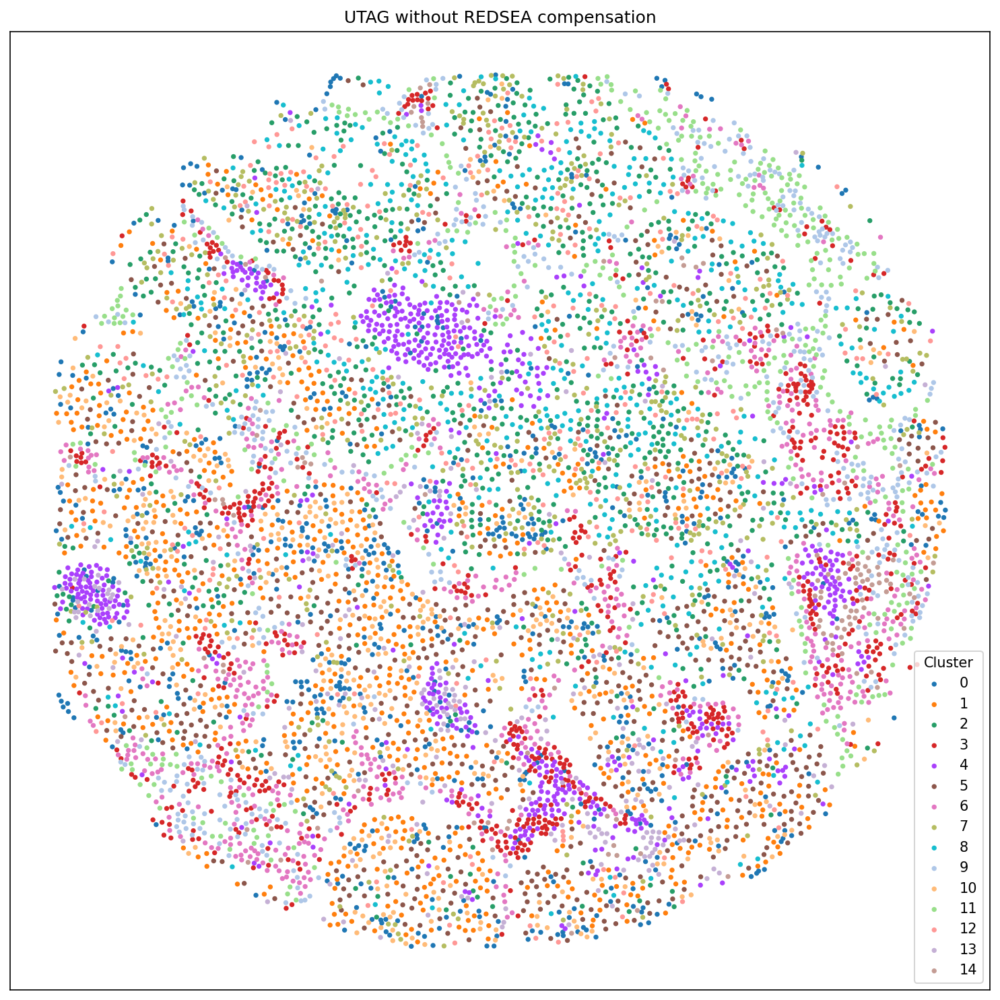

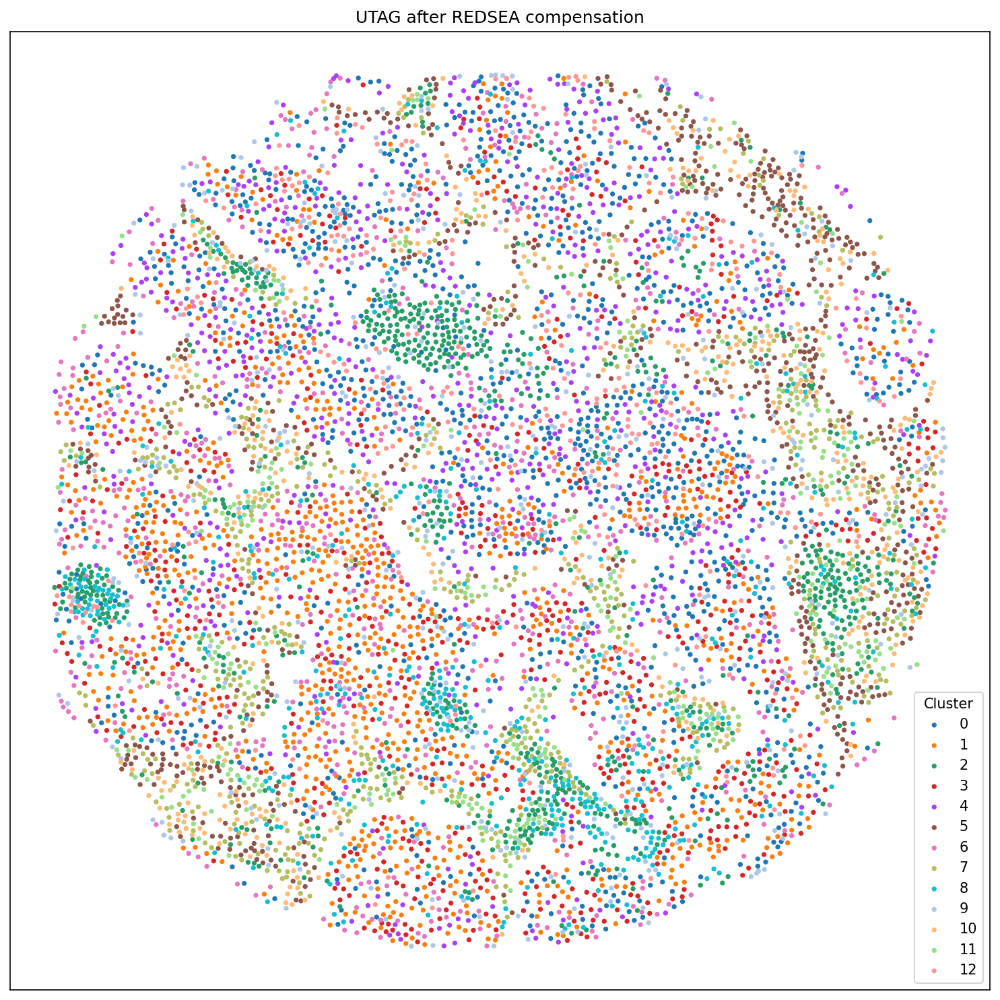

In [23]:
def visualize_entire_slide(adata, color_key='UTAG Label_parc_0.3', dpi=150, title_text = 'Entire Slide', invert_x=False, rotate=False):
    """
    Visualize the entire slide from an AnnData object as a scatterplot.
    Points are colored based on the specified color key.

    Parameters:
        adata (AnnData): The AnnData object containing the data.
        color_key (str): The key in adata.obs to be used for coloring points.
        dpi (int): Dots per inch, controls the resolution of the plot.
    """
    plt.figure(figsize=(10, 10), dpi=dpi)
    ax = plt.gca()

    ax.invert_yaxis()

    # Optionally invert the x-axis
    if invert_x:
        ax.invert_xaxis()

    # Prepare data for plotting
    x, y = 'X_centroid', 'Y_centroid'
    if rotate:
        # Rotate the plot by swapping x and y
        x, y = y, x

    # Create a scatter plot using the X and Y centroids
    sc.pl.scatter(adata, x=x, y=y, color=color_key, ax=ax, title=title_text, show=False, size = 50)

    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.legend(title="Cluster")

    plt.tight_layout()
    plt.show()

#  usage
visualize_entire_slide(results, dpi=150, title_text='UTAG without REDSEA compensation', invert_x=False, rotate=True)
visualize_entire_slide(redsea_results, dpi=150, title_text='UTAG after REDSEA compensation')

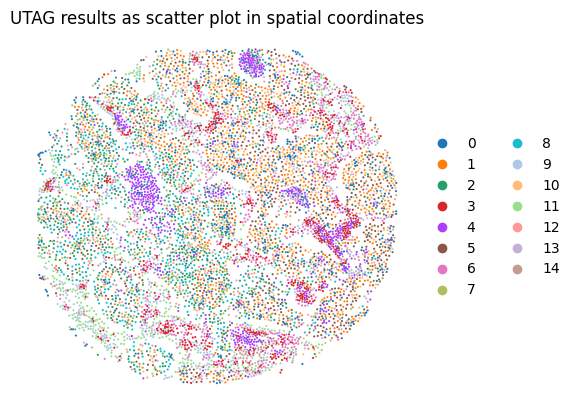

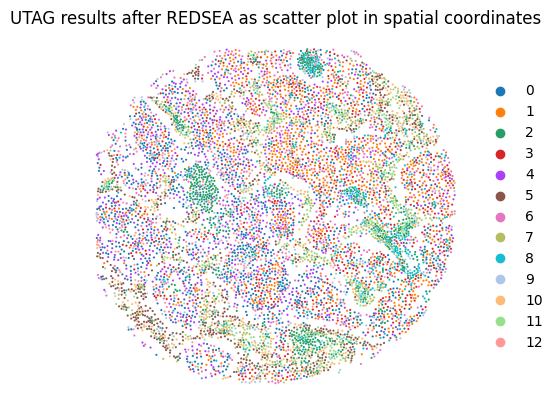

In [24]:
sc.pl.spatial(results, color = 'UTAG Label_parc_0.3', spot_size = 10, title = 'UTAG results as scatter plot in spatial coordinates', frameon = False)
sc.pl.spatial(redsea_results, color = 'UTAG Label_parc_0.3', spot_size = 10, title = 'UTAG results after REDSEA as scatter plot in spatial coordinates', frameon = False)


# Metric Comparisons of UTAG and REDSEA UTAG

In [25]:
import numpy as np
import pandas as pd
from scipy.special import comb

def calculate_cluster_correlation(adata, return_type='all'):
    """
    Calculates the weighted average pairwise Pearson correlation for each cluster or overall,
    weighted by the number of pairs in the cluster.

    Parameters:
        adata (AnnData): An AnnData object containing the expression data in `.X` and cluster labels in `.obs['UTAG Label_parc_0.3']`.
        return_type (str): 'per_cluster' to return correlations for each cluster, 'all' to return the overall average.

    Returns:
        pd.DataFrame or float: Depending on `return_type`, either a DataFrame with correlations per cluster
        or a single float representing the overall average correlation.
    """
    cluster_labels = adata.obs['UTAG Label_parc_0.3']
    unique_labels = np.unique(cluster_labels)
    cluster_correlations = []
    all_correlations = []
    weights = []

    for label in unique_labels:
        indices = np.where(cluster_labels == label)[0]
        cluster_data = adata.X[indices]
        num_pairs = comb(len(cluster_data), 2)  # Number of ways to choose 2 points from the cluster

        if len(cluster_data) > 1:
            corr_matrix = np.corrcoef(cluster_data.T)
            upper_tri_indices = np.triu_indices_from(corr_matrix, k=1)
            mean_corr = np.mean(corr_matrix[upper_tri_indices])
            all_correlations.extend(corr_matrix[upper_tri_indices] * num_pairs)  # Weight correlations by number of pairs
            weights.append(num_pairs)
        else:
            mean_corr = np.nan  # Handle clusters with a single cell

        cluster_correlations.append([label, mean_corr])

    if return_type == 'all':
        overall_mean = np.sum(all_correlations) / np.sum(weights) if weights else np.nan  # Calculate weighted average
        return overall_mean
    else:
        # Creating a DataFrame for per-cluster analysis
        correlation_df = pd.DataFrame(cluster_correlations, columns=['Cluster', 'Mean Correlation'])
        return correlation_df

print(calculate_cluster_correlation(results, 'per_cluster'))
print(calculate_cluster_correlation(redsea_results, 'per_cluster'))

print("mean correlation without spillover correction",calculate_cluster_correlation(results))
print("mean correlation with spillover correction",calculate_cluster_correlation(redsea_results))


    Cluster  Mean Correlation
0         0          0.344191
1         1          0.254424
2         2          0.306486
3         3          0.334841
4         4          0.329959
5         5          0.375204
6         6          0.344012
7         7          0.300157
8         8          0.475122
9         9          0.336959
10       10          0.242737
11       11          0.350536
12       12          0.224812
13       13          0.367999
14       14          0.386406
    Cluster  Mean Correlation
0         0          0.268455
1         1          0.148254
2         2          0.215113
3         3          0.172848
4         4          0.162176
5         5          0.206015
6         6          0.181878
7         7          0.223346
8         8          0.212838
9         9          0.128395
10       10          0.202482
11       11          0.198268
12       12          0.264346
mean correlation without spillover correction 161.48852981057655
mean correlation with spillover cor

# Clustering overlayed on tiff

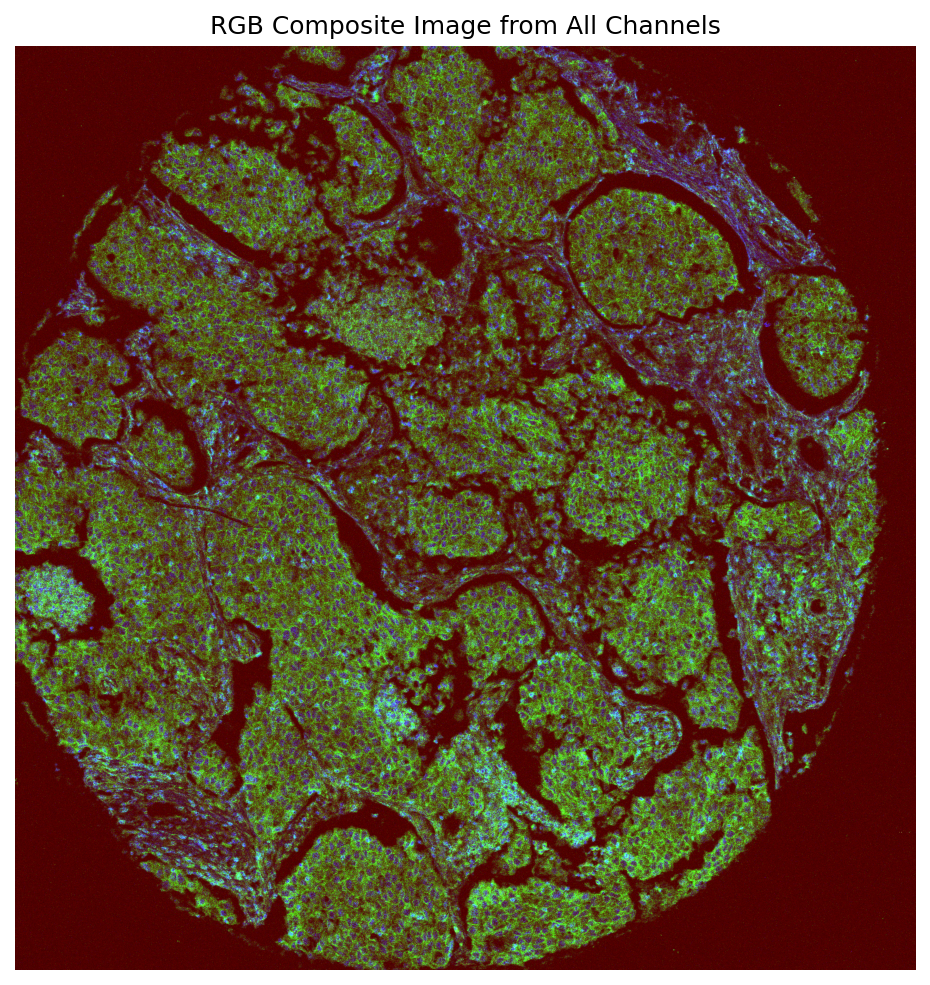

In [65]:
normalized_channels = cropped_img_data / np.max(cropped_img_data, axis=(0, 1), keepdims=True)

# Define how many channels to merge into each composite channel
group_size = cropped_img_data.shape[2] // 3

# Compute composite channels
red_composite = np.mean(normalized_channels[:, :, 0:group_size], axis=2) * 4 # red is mostly backgroud
green_composite = np.mean(normalized_channels[:, :, group_size:2*group_size], axis=2) * 30
blue_composite = np.mean(normalized_channels[:, :, 2*group_size:], axis=2) * 30

# Stack the composite channels to form an RGB image and clip values to the range [0, 1]
rgb_image = np.clip(np.stack([red_composite, green_composite, blue_composite], axis=-1), 0, 1)

plt.figure(figsize=(10, 8), dpi = 150)
plt.imshow(rgb_image)#, aspect='equal')
plt.title('RGB Composite Image from All Channels')
plt.axis('off')  # Hide axes for a cleaner look
plt.show()

In [43]:
#overlaying clustering on the image
def overlay_clusters_on_tiff(image, adata, color_key='UTAG Label_parc_0.3', dpi=150, title_text='Clustering Overlay on TIFF'):
    plt.figure(figsize=(10, 8), dpi=dpi)
    plt.imshow(image)  # Display the underlying image
    plt.title(title_text)

    # Get unique clusters and corresponding colors
    unique_clusters = np.unique(adata.obs[color_key])
    cmap = plt.get_cmap('gist_rainbow')
    colors = cmap(np.linspace(0, 1, len(unique_clusters)))

    # Create a scatter plot for each cluster to enable custom legends
    for cluster, color in zip(unique_clusters, colors):
        indices = adata.obs[color_key] == cluster
        plt.scatter(adata.obs['X_centroid'][indices], adata.obs['Y_centroid'][indices], color=color, label=cluster, alpha=0.6, edgecolor='none', s=5)

    # Create a legend
    handles = [mpatches.Patch(color=color, label=cluster) for cluster, color in zip(unique_clusters, colors)]
    plt.legend(handles=handles, title='Cluster ID', loc='upper left', bbox_to_anchor=(1, 1))

    # Hide axes details for better visibility
    plt.axis('off')
    plt.show()

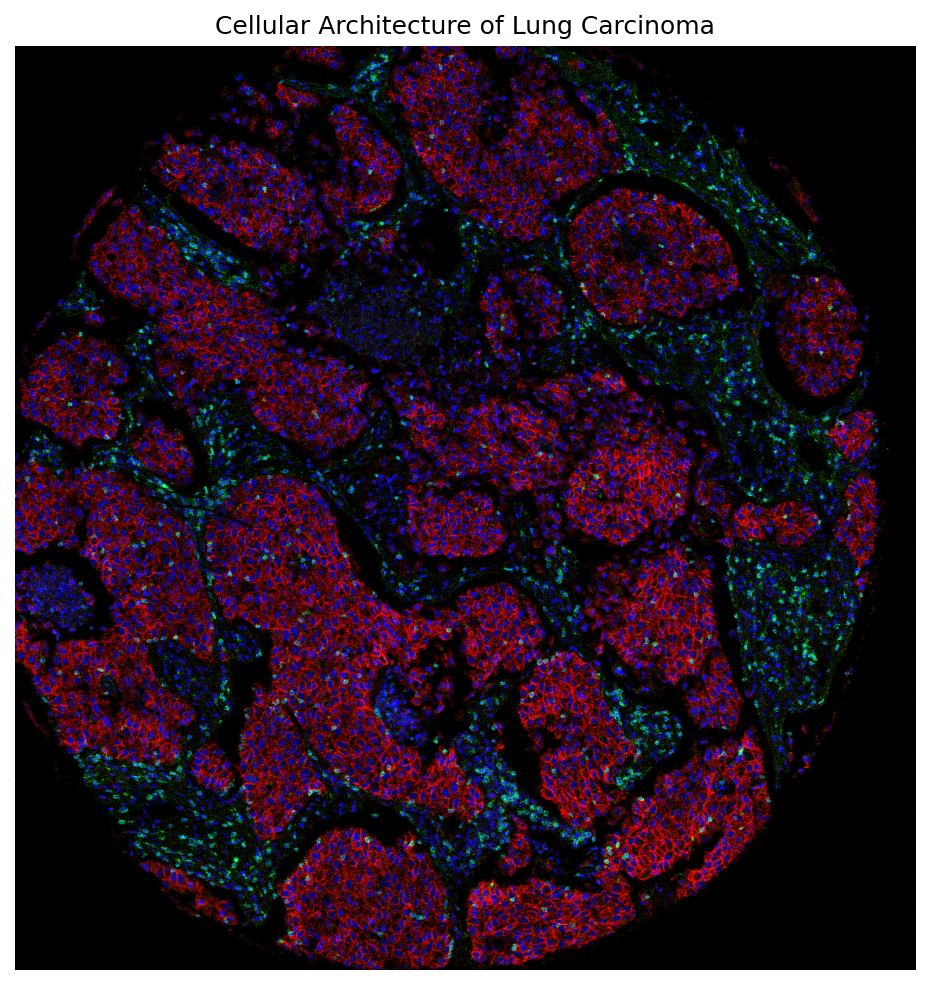

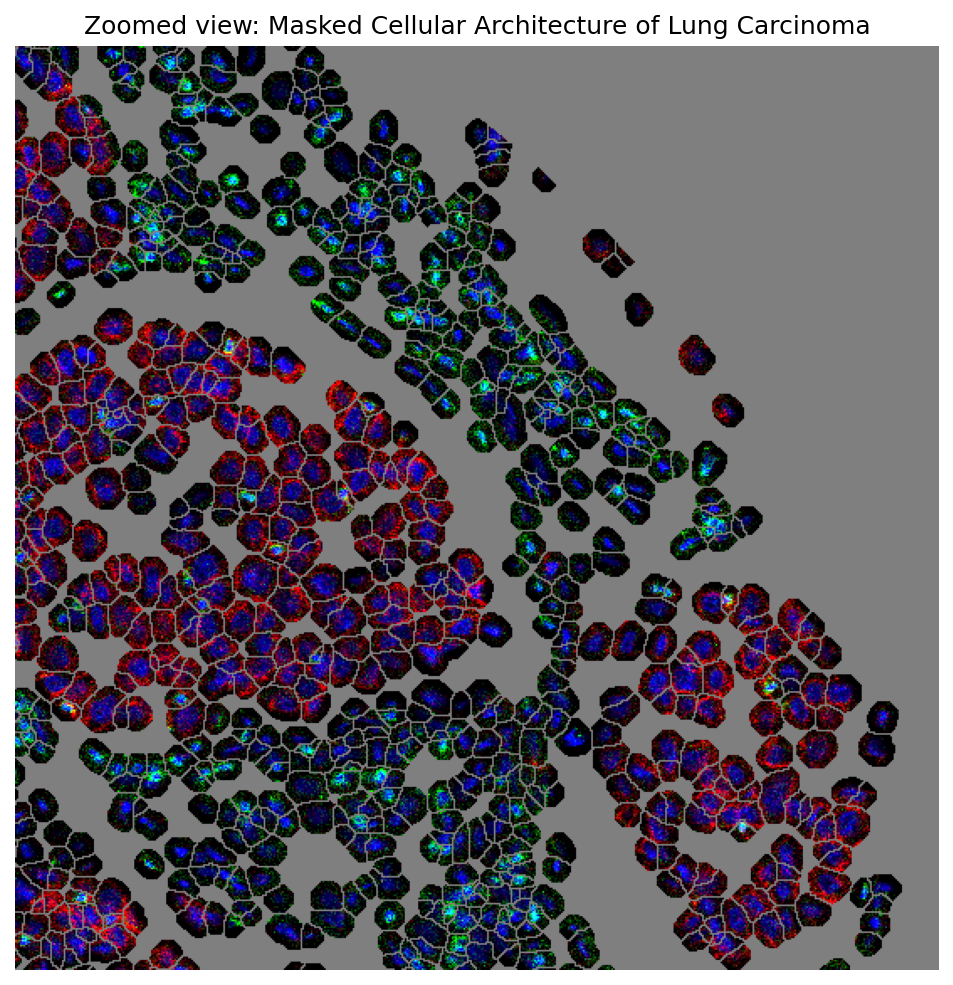

In [68]:
#Plot as overview of image - set to work for lung cancer

red_indexes = [22]           # ECadherin
green_indexes = [33]             # CD3
blue_indexes = [41,42]     # DNA

###
# Select and combine channels for RGB
# This is a simplification; you might want to test different combinations
red_composite = np.mean(normalized_channels[:,:,red_indexes], axis=2) * 4
green_composite = np.mean(normalized_channels[:,:,green_indexes], axis=2) * 6
blue_composite = np.mean(normalized_channels[:,:,blue_indexes], axis=2) * 15

# Create RGB image
rgb_image = np.stack([red_composite, green_composite, blue_composite], axis=-1)

plt.figure(figsize=(10, 8), dpi=150)
plt.imshow(rgb_image)
plt.title('Cellular Architecture of Lung Carcinoma')
plt.axis('off')  # Hide axes for a cleaner look
plt.show()

# Ensure the mask is a boolean array (True for cells, False for background)
mask_bool = mask > 0  # Dependent on non-zero mask values to indicate cell areas

# with grey background
grey_background = np.full_like(rgb_image, fill_value=0.5)  # Set a grey level (0.5 for mid-grey)
masked_composite_image = np.where(mask_bool[..., None], rgb_image, grey_background)

# Example coordinates for the zoomed area
x_min, x_max = 1050, 1600  # x coordinates (columns) of the zoom region
y_min, y_max = 100, 650  # y coordinates (rows) of the zoom region

plt.figure(figsize=(10, 8), dpi=150)
plt.imshow(masked_composite_image[y_min:y_max, x_min:x_max], aspect='equal')  # Zoom into the specified region
plt.title('Zoomed view: Masked Cellular Architecture of Lung Carcinoma')
plt.axis('off')  # Hide axes for a cleaner look
plt.show()

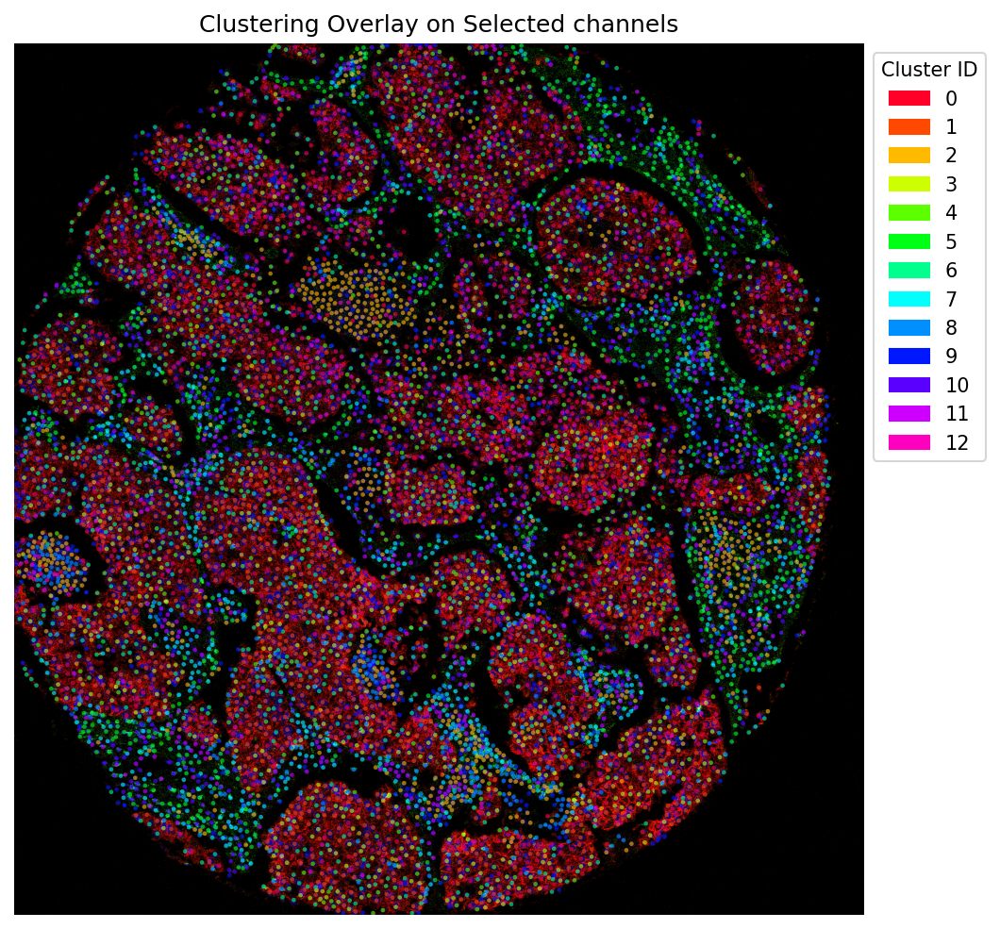

In [69]:
#Overlay clusters on selected channels
overlay_clusters_on_tiff(rgb_image, redsea_results, dpi=150, title_text='Clustering Overlay on Selected channels')

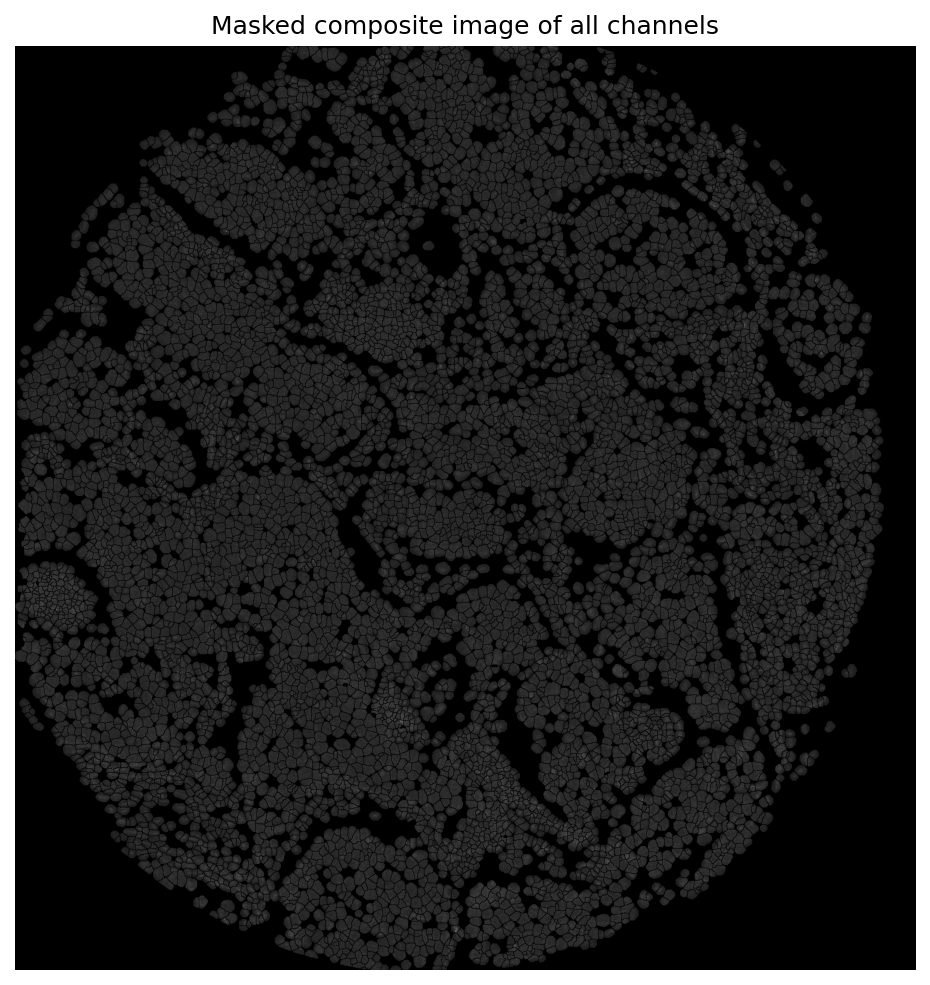

In [71]:
### Overlaying mask over unmodified feature image.
# Normalize all channels to the range [0, 1]
#normalized_channels = img / np.max(img, axis=(1, 2), keepdims=True)

# Stack normalized channels into one composite image (sum or average)
composite_image = np.mean(normalized_channels, axis=2) * 3

# Ensure the mask is a boolean array (True for cells, False for background)
mask_bool = mask > 0  # Dependent on non-zero mask values to indicate cell areas

# Apply the mask to the composite image
masked_composite_image = np.zeros_like(composite_image)
masked_composite_image[mask_bool] = composite_image[mask_bool]

plt.figure(figsize=(10, 8), dpi=150)
plt.imshow(masked_composite_image, cmap='gray')
plt.title('Masked composite image of all channels')
plt.axis('off')  # Hide axes for a cleaner look
plt.show()


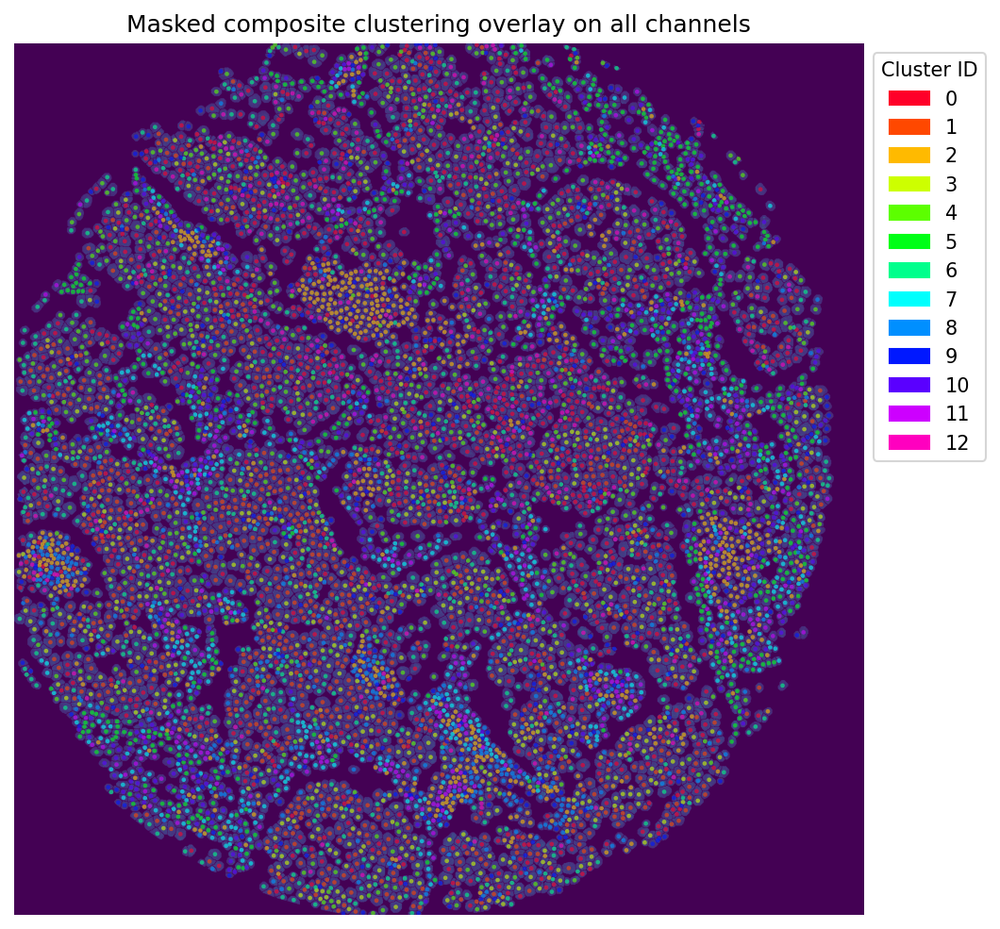

In [72]:
overlay_clusters_on_tiff(masked_composite_image, redsea_results, dpi=150, title_text='Masked composite clustering overlay on all channels')

# Expression levels in each cluster

<ipython-input-81-f2264299d7f4>:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_stats = filtered_df.groupby('cluster').agg(['mean', 'std'])


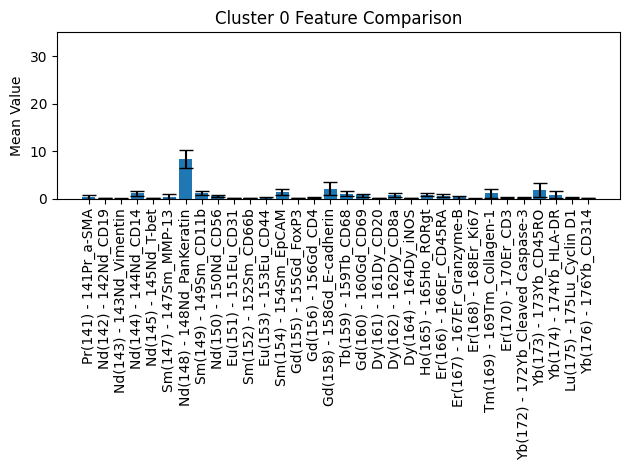

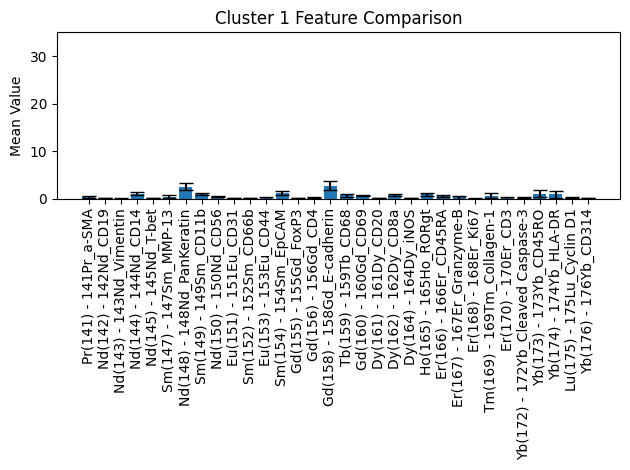

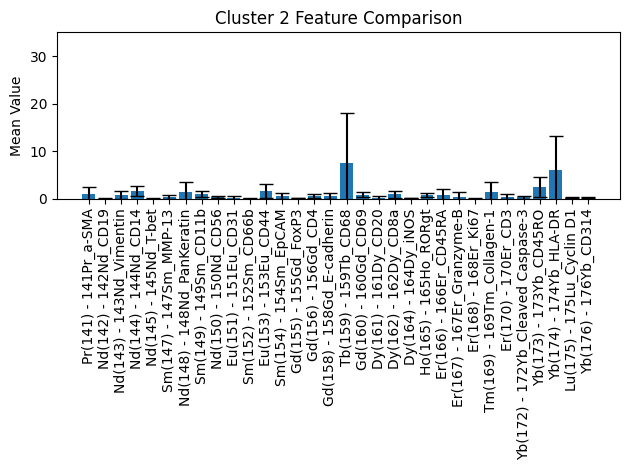

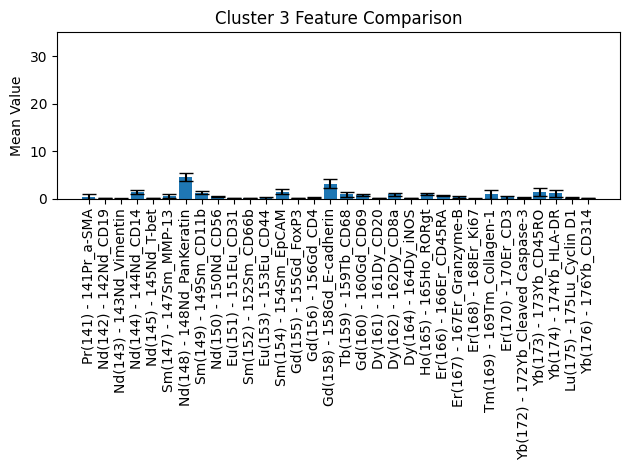

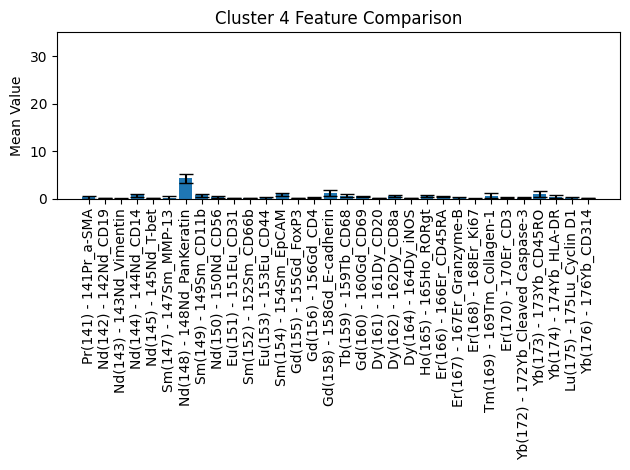

...

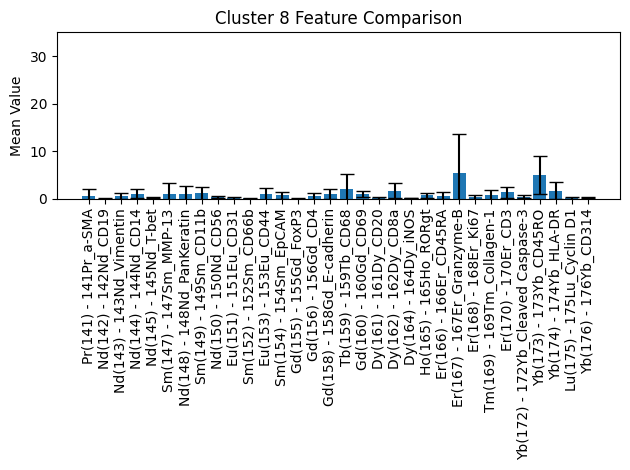

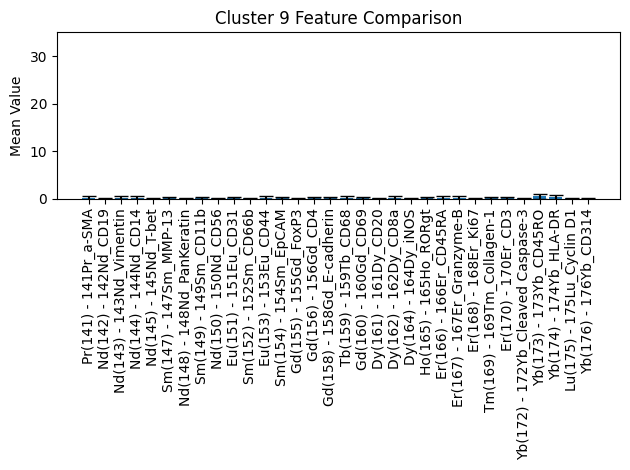

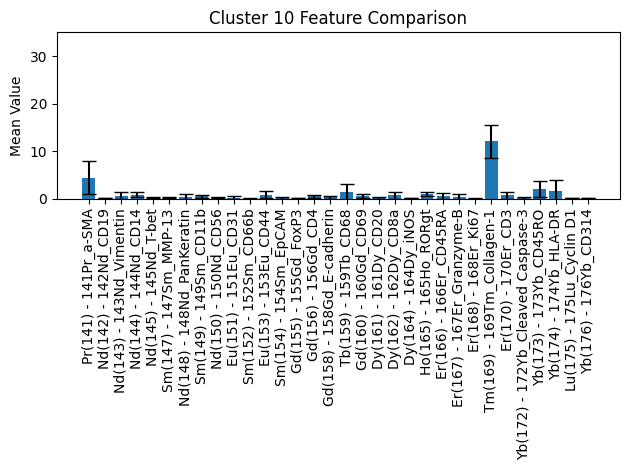

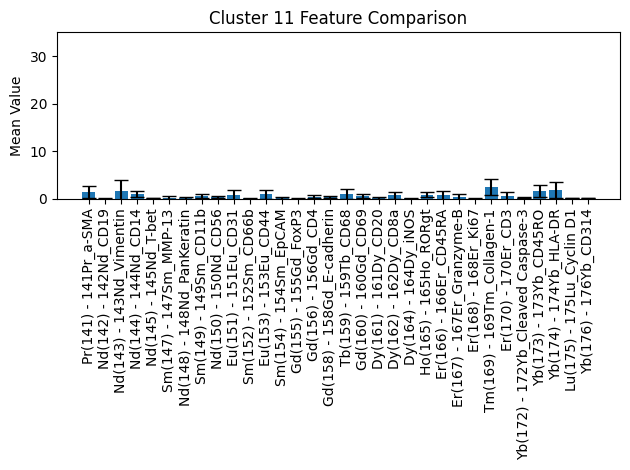

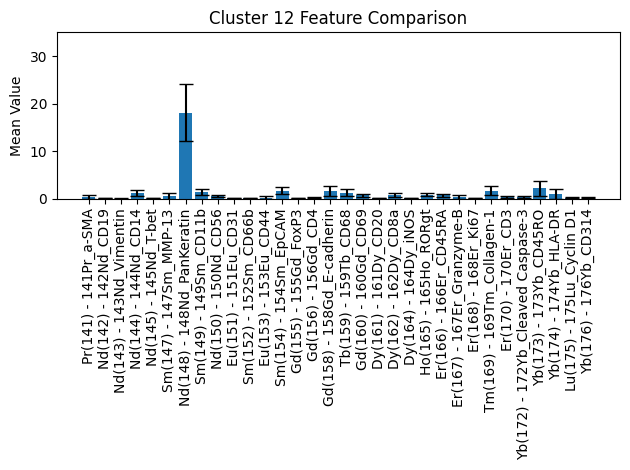

In [81]:
### features of each cluster, ignoring <EMPTY> features

#data setup
clusters = redsea_results.obs['UTAG Label_parc_0.3']
feature_data = redsea_results.to_df()  # This converts the data matrix to DataFrame if it's AnnData
df = pd.DataFrame(data=feature_data, columns=redsea_results.var_names)
df['cluster'] = clusters

# Create a boolean mask for columns that do not contain "<EMPTY>"
valid_columns = [col for col in df.columns if "<EMPTY>" not in col]
filtered_df = df[valid_columns]

cluster_stats = filtered_df.groupby('cluster').agg(['mean', 'std'])

# Separate means and stds for easier access
means = cluster_stats.xs('mean', axis=1, level=1)  # Gets the 'mean' level for all features
stds = cluster_stats.xs('std', axis=1, level=1)    # Gets the 'std' level for all features
num_clusters = len(means)


# Create a separate bar chart for each cluster
for cluster_id in range(num_clusters):
    cluster_means = means.loc[cluster_id]
    cluster_stds = stds.loc[cluster_id]

    # Plot
    fig, ax = plt.subplots()
    ax.bar(cluster_means.index, cluster_means.values, yerr=cluster_stds.values, capsize=5)
    ax.set_ylim(0,35)
    ax.set_ylabel('Mean Value')
    ax.set_title(f'Cluster {cluster_id} Feature Comparison')
    ax.set_xticks(range(len(cluster_means)))
    ax.set_xticklabels(cluster_means.index, rotation=90)
    plt.tight_layout()  # Adjust layout to make room for x-labels

    plt.show()


<ipython-input-82-d3d1df5b5440>:19: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = filtered_df.groupby('cluster').mean()


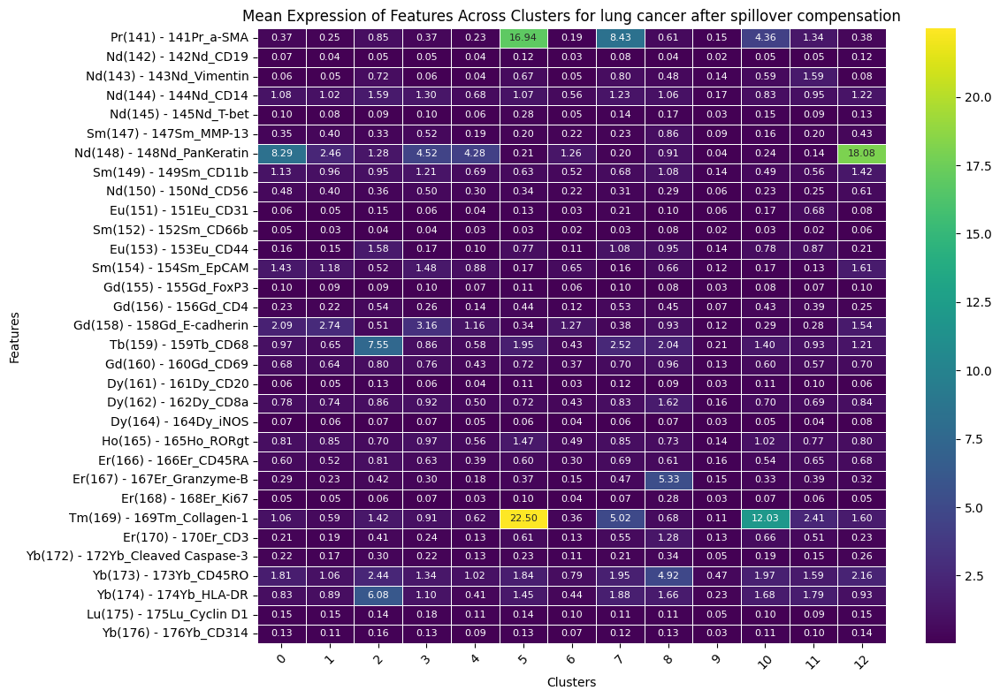

In [82]:
### Heatmap to find differences in clusters

clusters = redsea_results.obs['UTAG Label_parc_0.3']
feature_data = redsea_results.to_df()  # Converts data matrix to DataFrame if it's AnnData
df = pd.DataFrame(data=feature_data, columns=redsea_results.var_names)
df['cluster'] = clusters  # Adding cluster assignments directly to DataFrame


filtered_df = df

# Create a boolean mask for columns that do not contain "<EMPTY>"
#valid_columns = [col for col in df.columns if "<EMPTY>" not in col and col != 'cluster']  # Exclude 'cluster' to prevent duplication
# Ensure the 'cluster' column is included for grouping, but not duplicated
#filtered_df = df[valid_columns + ['cluster']]  # Add 'cluster' column correctly
#drop column preventing comparison
#filtered_df = filtered_df.drop(['HistoneH3(In113)'], axis=1)

# Group by 'cluster' and calculate the mean for each feature
cluster_means = filtered_df.groupby('cluster').mean()

# Creating the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(cluster_means.T, cmap='viridis', linewidths=.5,
            annot = True, fmt=".2f", annot_kws={'size': 8})
plt.title('Mean Expression of Features Across Clusters for lung cancer after spillover compensation')
plt.xlabel('Clusters')
plt.ylabel('Features')
plt.xticks(rotation=45)  # Adjust rotation if needed
plt.tight_layout()  # Adjust layout to make sure labels are not cut off
plt.show()


<ipython-input-83-9061464c2213>:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_means = filtered_df.groupby('cluster').mean()


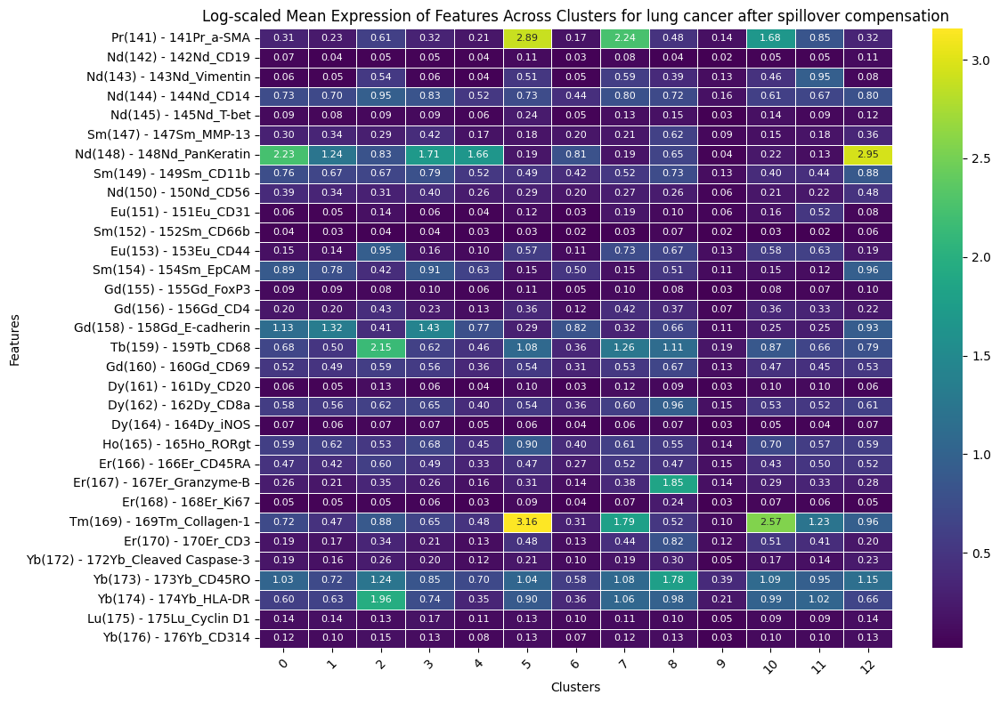

In [83]:
### LOG Heatmap to find differences in clusters

#assumes vars for cluster_means is defined
#filtered_df = df[valid_columns + ['cluster']]  # Add 'cluster' column correctly

#drop column preventing comparison
#filtered_df = filtered_df.drop(['HistoneH3(In113)','CD206(Nd144)'], axis=1)

# Group by 'cluster' and calculate the mean for each feature
cluster_means = filtered_df.groupby('cluster').mean()


# Group by 'cluster' and calculate the mean for each feature
log_cluster_means = np.log1p(cluster_means)

# Creating the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(log_cluster_means.T, cmap='viridis', linewidths=.5,
            annot = True, fmt=".2f", annot_kws={'size': 8})
plt.title('Log-scaled Mean Expression of Features Across Clusters for lung cancer after spillover compensation')
plt.xlabel('Clusters')
plt.ylabel('Features')
plt.xticks(rotation=45)  # Adjust rotation if needed
plt.tight_layout()  # Adjust layout to make sure labels are not cut off
plt.show()
